In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import tqdm
from torch import nn
import torchvision
from torch.utils.data import Dataset, DataLoader

import cv2
import os
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
import torchvision.utils as vutils
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

/home/artem/anaconda3/envs/itmo_cv_project/lib/python3.8/site-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)
/home/artem/anaconda3/envs/itmo_cv_project/lib/python3.8/site-packages/torchvision/transforms/v2/__init__.py:54: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. 

Полные логи экспериментов, графики и примеры генерируемых изображений доступны в файлах tensorboard в папке ./logs_dcgan

In [2]:
# Дирректория с изображениями
dataroot = "data/"

# Количество воркеров для сборки датасета
workers = 8

# Размер батча
batch_size = 64

# Размер входа сети для изображений. Все изображения ресайзятся к нему
image_size = 128

# Количество каналов цвета
nc = 3

# Размер латентного вектора (размерность латентного пространства)
nz = 100

# Size of feature maps in generator
ngf = 64

# Рамер карты признаков для генератора
ndf = 64

# Кол-во эпох
num_epochs = 10

# Лернингрейт
lr_g = 0.0001
lr_d = 0.000001

# Параметр для оптимизатора Adam
beta1 = 0.5

# Количество GPU, 0 если считаем на CPU
ngpu = 1

/home/artem/anaconda3/envs/itmo_cv_project/lib/python3.8/site-packages/torchvision/transforms/v2/_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `transforms.Compose([transforms.ToImageTensor(), transforms.ConvertImageDtype()])`.
  warnings.warn(


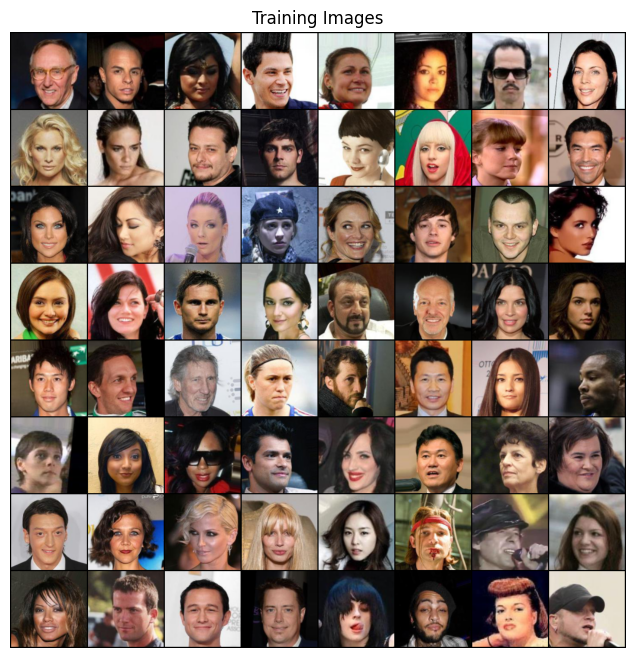

In [3]:

dataset = ImageFolder(root=dataroot,
                           transform=v2.Compose([
                               v2.Resize(image_size),
                               v2.CenterCrop(image_size),
                               v2.ToTensor(),
                               v2.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [4]:

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Имплементация CSPup блока

In [5]:
# имплементация CSPup блока
class CSPup(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super().__init__()
        self.kernel_size =kernel_size
        self.stride = stride
        self.padding = padding
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.split_channels = self.in_channels//2
        self.left = nn.Sequential(
            nn.ConvTranspose2d(self.split_channels, self.out_channels, self.kernel_size, self.stride, self.padding, bias=False),
        )
        self.right = nn.Sequential(
            nn.Conv2d(self.split_channels, self.out_channels , 1, 1, 0),
            nn.ReLU(),
            nn.ConvTranspose2d(self.out_channels, self.out_channels , self.kernel_size, self.stride, self.padding, bias=False),
            nn.Conv2d(self.out_channels, self.out_channels , 1, 1, 0),
            nn.ReLU(),
            nn.Conv2d(self.out_channels, self.out_channels, 1, 1, 0),
        )
    def forward(self, x):
        x1 = x[:, :self.split_channels, ...]
        x2 = x[:, self.split_channels:, ...]
        y = self.left(x1)+self.right(x2)
        return y


Имплементация Генератора на CSPup блоках

In [6]:
# Имплементация генератора
class Generator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # вход Z, идет в convolution
            CSPup(nz, ngf * 16, 4, 1, 0),
            # state size. (ngf*16) x 4 x 4
            CSPup(ngf * 16, ngf * 8, 4, 2, 1),
            # state size. (ngf*8) x 8 x 8
            CSPup(ngf * 8, ngf * 4, 4, 2, 1),
            # state size. (ngf*4) x 16 x 16
            CSPup(ngf * 4, ngf * 2, 4, 2, 1),
            # state size. (ngf*2) x 32 x 32
            CSPup(ngf * 2, ngf, 4, 2, 1),
            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 128 x 128
        )

    def forward(self, input):
        return self.main(input)

In [15]:
# # Имплементация генератора
# class Generator(nn.Module):
#     def __init__(self, ngpu):
#         super(Generator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(
#             # вход Z, идет в convolution
#             nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
#             nn.BatchNorm2d(ngf * 8),
#             nn.ReLU(True),
#             # state size. (ngf*8) x 4 x 4
#             nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 4),
#             nn.ReLU(True),
#             # state size. (ngf*4) x 8 x 8
#             nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 2),
#             nn.ReLU(True),
#             # state size. (ngf*2) x 16 x 16
#             nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf),
#             nn.ReLU(True),
#             # state size. (ngf) x 32 x 32
#             nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
#             nn.Tanh()
#             # state size. (nc) x 64 x 64
#         )

#     def forward(self, input):
#         return self.main(input)

Имплементация дискриминатора.

Добавил к изначальной имплементации дополнительный блок свертки для работы с изображениями 128x128

In [7]:
# Имплементация дискриминатора


class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [12]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (3): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (3): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5):

In [58]:

criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

lr_g = 0.0001
lr_d = 0.00005

optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))


In [43]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/10][0/3166]	Loss_D: 1.7721	Loss_G: 5.5889	D(x): 0.5671	D(G(z)): 0.5487 / 0.0060
[0/10][50/3166]	Loss_D: 2.0017	Loss_G: 14.9216	D(x): 0.6490	D(G(z)): 0.0395 / 0.0000
[0/10][100/3166]	Loss_D: 0.6076	Loss_G: 13.2182	D(x): 0.8141	D(G(z)): 0.0233 / 0.0000
[0/10][150/3166]	Loss_D: 0.6236	Loss_G: 9.4581	D(x): 0.7992	D(G(z)): 0.0064 / 0.0001
[0/10][200/3166]	Loss_D: 0.7689	Loss_G: 6.8535	D(x): 0.7815	D(G(z)): 0.0721 / 0.0013
[0/10][250/3166]	Loss_D: 1.5160	Loss_G: 8.8610	D(x): 0.8087	D(G(z)): 0.3502 / 0.0002
[0/10][300/3166]	Loss_D: 0.3754	Loss_G: 6.6611	D(x): 0.8953	D(G(z)): 0.0476 / 0.0016
[0/10][350/3166]	Loss_D: 0.2186	Loss_G: 7.2067	D(x): 0.9263	D(G(z)): 0.0588 / 0.0016
[0/10][400/3166]	Loss_D: 0.2531	Loss_G: 7.6572	D(x): 0.9107	D(G(z)): 0.0065 / 0.0008
[0/10][450/3166]	Loss_D: 0.1895	Loss_G: 6.5756	D(x): 0.9264	D(G(z)): 0.0344 / 0.0017
[0/10][500/3166]	Loss_D: 0.2074	Loss_G: 6.5727	D(x): 0.9708	D(G(z)): 0.0591 / 0.0016
[0/10][550/3166]	Loss_D: 0.0883	Loss_G: 

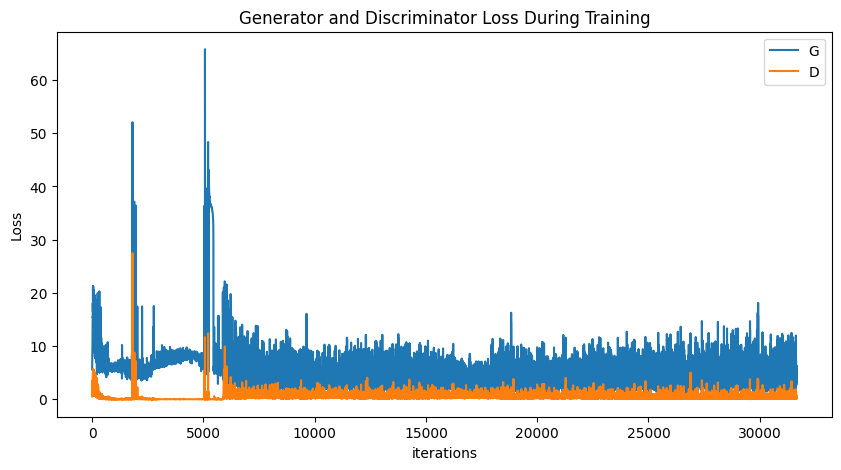

In [45]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

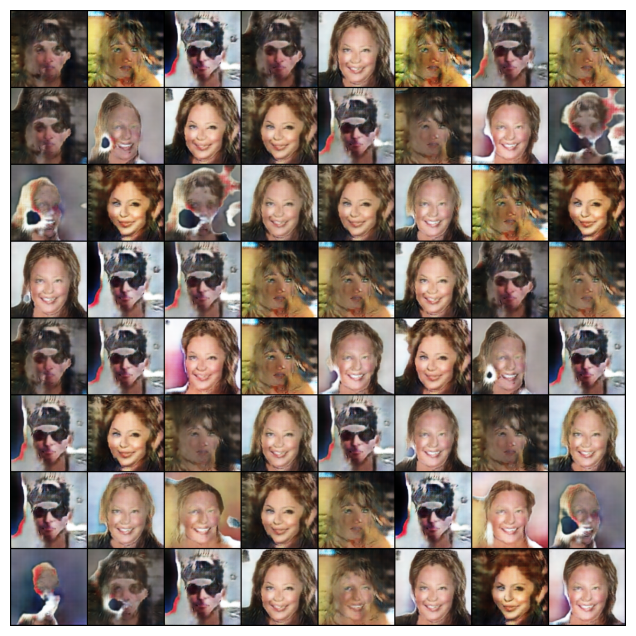

In [48]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[-10:]]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

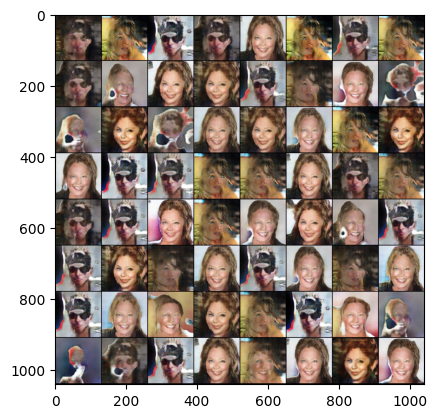

In [47]:
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

In [32]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (3): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (3): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5):

Первый эксперимент. В ходе него я подбирал оптимальный learning rate и batch size для генератора и дискриминатора, чтобы добиться более-менее стабильной тренировки. 

Остановился на значениях lr_g = 0.0001, lr_d = 0.00005, batch_size = 64, но хороших результатов достичь не получилось, т.к. дискриминатор всегда обучался слишком быстро, его лосс стремительно падал, и генератор за ним не успевал.

In [33]:
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

lr_g = 0.0001
lr_d = 0.00005

# Устанавливаем оптимизаторы для G и D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))

In [34]:
# Training Loop
run_dir = 'exp1'
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
writer = SummaryWriter(log_dir=f'./logs_dcgan/{run_dir}')

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            writer.add_scalar("iter/Loss_D", errD.item(), iters)
            writer.add_scalar("iter/Loss_G", errG.item(), iters)
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 1000 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            grid = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(grid)
            writer.add_image("gen_img_vis", grid, iters)


        iters += 1

writer.close()

Starting Training Loop...
[0/10][0/3166]	Loss_D: 1.8844	Loss_G: 5.8532	D(x): 0.4909	D(G(z)): 0.5025 / 0.0042
[0/10][50/3166]	Loss_D: 4.9099	Loss_G: 19.4961	D(x): 0.8286	D(G(z)): 0.9794 / 0.0000
[0/10][100/3166]	Loss_D: 1.5627	Loss_G: 12.1256	D(x): 0.6971	D(G(z)): 0.1861 / 0.0000
[0/10][150/3166]	Loss_D: 0.6551	Loss_G: 8.1620	D(x): 0.8550	D(G(z)): 0.0953 / 0.0004
[0/10][200/3166]	Loss_D: 2.4732	Loss_G: 14.1883	D(x): 0.6990	D(G(z)): 0.0017 / 0.0000
[0/10][250/3166]	Loss_D: 1.3055	Loss_G: 10.3040	D(x): 0.7840	D(G(z)): 0.3589 / 0.0000
[0/10][300/3166]	Loss_D: 0.6507	Loss_G: 7.8975	D(x): 0.9020	D(G(z)): 0.1790 / 0.0006
[0/10][350/3166]	Loss_D: 0.2689	Loss_G: 6.3147	D(x): 0.9314	D(G(z)): 0.0293 / 0.0028
[0/10][400/3166]	Loss_D: 0.3133	Loss_G: 7.8798	D(x): 0.8968	D(G(z)): 0.0298 / 0.0005
[0/10][450/3166]	Loss_D: 0.0489	Loss_G: 6.6678	D(x): 0.9923	D(G(z)): 0.0399 / 0.0015
[0/10][500/3166]	Loss_D: 0.1555	Loss_G: 5.2929	D(x): 0.9449	D(G(z)): 0.0451 / 0.0058
[0/10][550/3166]	Loss_D: 0.4219	Loss_G

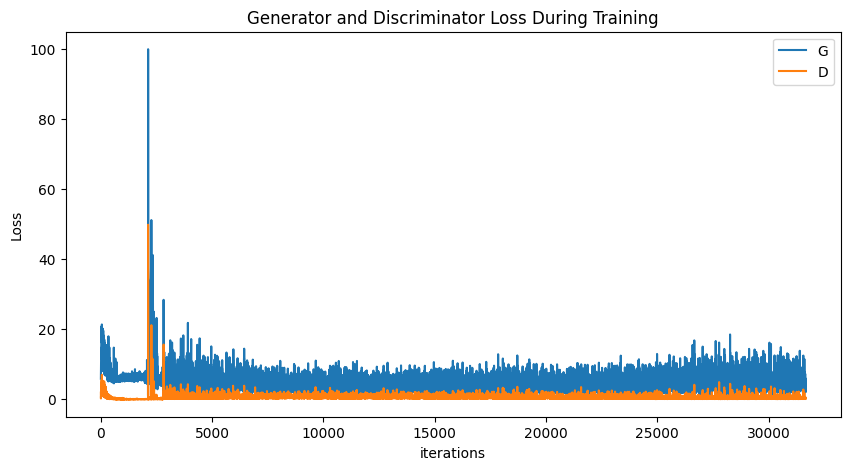

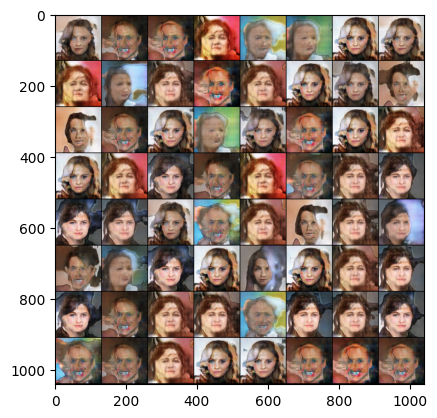

In [35]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

Эксперимент 2. Попробуем применить [фишку](https://github.com/soumith/ganhacks/issues/36) из репозитория gan-hacks, чтобы побороться со слишком быстрым уменьшением лосса дискриминатора, заменив BCELoss на BCEWithLogitsLoss, и, соответственно, убрав сигмоиду в конце дискриминатора

In [36]:

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False)
        )

    def forward(self, input):
        return self.main(input)

In [37]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (3): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (3): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5):

In [38]:
# Инициализируем лосс
criterion = nn.BCEWithLogitsLoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.


lr_g = 0.0001
lr_d = 0.00005

# Устанавливаем оптимизаторы для G и D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))

In [39]:

run_dir = 'exp2'
img_list = []
G_losses = []
D_losses = []
iters = 0
writer = SummaryWriter(log_dir=f'./logs_dcgan/{run_dir}')

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            writer.add_scalar("iter/Loss_D", errD.item(), iters)
            writer.add_scalar("iter/Loss_G", errG.item(), iters)
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            grid = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(grid)
            writer.add_image("gen_img_vis", grid, iters)


        iters += 1

writer.close()

Starting Training Loop...
[0/10][0/3166]	Loss_D: 1.1011	Loss_G: 4.5704	D(x): 0.1387	D(G(z)): -1.5937 / -4.5569
[0/10][50/3166]	Loss_D: 1.4503	Loss_G: 17.8143	D(x): 3.0848	D(G(z)): -1.0258 / -17.8143
[0/10][100/3166]	Loss_D: 2.4853	Loss_G: 12.8201	D(x): 0.2160	D(G(z)): -3.5629 / -12.8201
[0/10][150/3166]	Loss_D: 3.9768	Loss_G: 16.4418	D(x): 3.9595	D(G(z)): 3.1551 / -16.4418
[0/10][200/3166]	Loss_D: 0.4122	Loss_G: 13.0005	D(x): 6.5711	D(G(z)): -8.9618 / -13.0005
[0/10][250/3166]	Loss_D: 1.4111	Loss_G: 15.2371	D(x): 6.6356	D(G(z)): 0.7316 / -15.2371
[0/10][300/3166]	Loss_D: 0.9028	Loss_G: 8.8036	D(x): 6.2180	D(G(z)): -2.0738 / -8.8034
[0/10][350/3166]	Loss_D: 0.5361	Loss_G: 10.7495	D(x): 7.3916	D(G(z)): -1.3298 / -10.7494
[0/10][400/3166]	Loss_D: 0.1668	Loss_G: 7.0773	D(x): 8.1308	D(G(z)): -2.7029 / -7.0761
[0/10][450/3166]	Loss_D: 0.1798	Loss_G: 6.1519	D(x): 7.2723	D(G(z)): -3.0109 / -6.1491
[0/10][500/3166]	Loss_D: 0.2320	Loss_G: 6.0008	D(x): 7.6865	D(G(z)): -3.8641 / -5.9975
[0/10][550

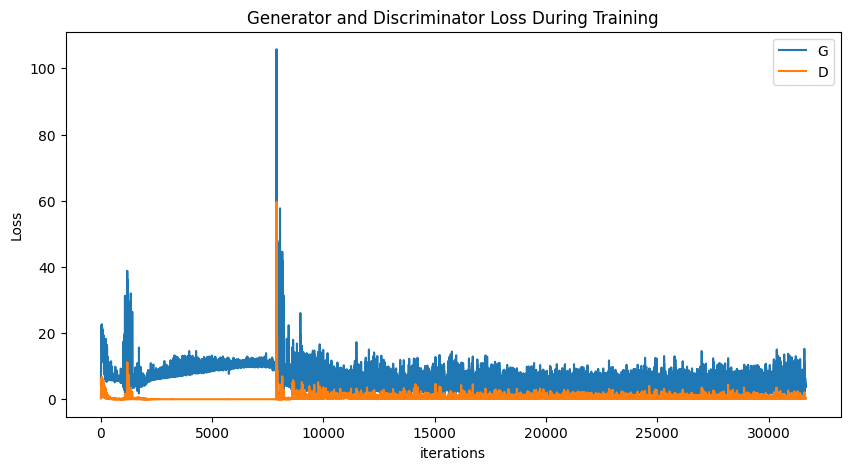

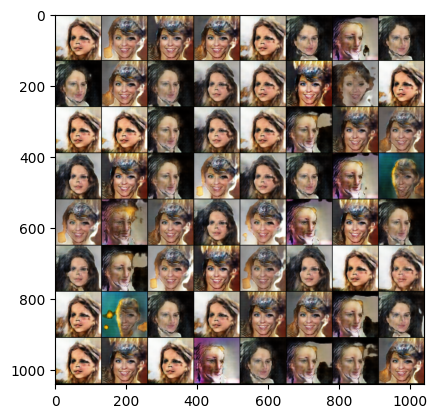

In [40]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

Как можно заметить, значительного улучшения данная модификация не дала

Эксперимент 3. Попробуем обучать дискриминатор каждые n итераций. Я попробовал разные n, лучшие результаты получились при n=2

In [46]:
# Имплементация дискриминатора

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [47]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (3): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (3): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5):

In [48]:
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

lr_g = 0.0001
lr_d = 0.00004

teach_d_every_n_iters = 2

# Устанавливаем оптимизаторы для G и D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))

In [49]:
# Learn discrim every 2 iters
run_dir = 'exp3'
img_list = []
G_losses = []
D_losses = []
iters = 0
writer = SummaryWriter(log_dir=f'./logs_dcgan/{run_dir}')

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        if iters % teach_d_every_n_iters == 0:
            netD.zero_grad()
            # Для батча
            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)
            label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            # Прямой прогон батча из реальных картинок D
            output = netD(real_cpu).view(-1)
            # Считаем лосс на всем батче реальных картинок
            errD_real = criterion(output, label)
            # Вычисляем градиенты для дискриминатора
            errD_real.backward()
            D_x = output.mean().item()

            ## Учим на полном фейковом батче
            # Генерируем бат латентных векторов
            
            # Генерируем фековый батч с помощью G
            
            label.fill_(fake_label)
            # Классифицируем фековый батч с помощью D
            output = netD(fake.detach()).view(-1)
            # Вычисляем лосс дискриминатора на фейковом батче
            errD_fake = criterion(output, label)
            # Вычисляем градиент для фейкового батча, он суммируется с предидущим
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            # Вычисляем ошибку на реальном и фековом батчах
            errD = errD_real + errD_fake
            # Обновляем веса D
            optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            writer.add_scalar("iter/Loss_D", errD.item(), iters)
            writer.add_scalar("iter/Loss_G", errG.item(), iters)
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 1000 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            grid = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(grid)
            writer.add_image("gen_img_vis", grid, iters)


        iters += 1

writer.close()

Starting Training Loop...
[0/10][0/3166]	Loss_D: 1.8286	Loss_G: 3.2135	D(x): 0.3879	D(G(z)): 0.3355 / 0.0591
[0/10][50/3166]	Loss_D: 73.4201	Loss_G: 0.0002	D(x): 0.6372	D(G(z)): 1.0000 / 0.9998
[0/10][100/3166]	Loss_D: 13.7612	Loss_G: 5.0780	D(x): 0.5428	D(G(z)): 1.0000 / 0.0077
[0/10][150/3166]	Loss_D: 52.0149	Loss_G: 0.2161	D(x): 0.4635	D(G(z)): 1.0000 / 0.8149
[0/10][200/3166]	Loss_D: 10.8287	Loss_G: 9.1324	D(x): 0.4451	D(G(z)): 0.9997 / 0.0002
[0/10][250/3166]	Loss_D: 9.4157	Loss_G: 10.9275	D(x): 0.3372	D(G(z)): 0.9880 / 0.0000
[0/10][300/3166]	Loss_D: 10.9268	Loss_G: 9.2433	D(x): 0.3218	D(G(z)): 0.9885 / 0.0001
[0/10][350/3166]	Loss_D: 11.6798	Loss_G: 7.0077	D(x): 0.1734	D(G(z)): 0.9797 / 0.0015
[0/10][400/3166]	Loss_D: 9.7709	Loss_G: 7.6633	D(x): 0.1932	D(G(z)): 0.9599 / 0.0008
[0/10][450/3166]	Loss_D: 8.0740	Loss_G: 5.7037	D(x): 0.4594	D(G(z)): 0.9487 / 0.0047
[0/10][500/3166]	Loss_D: 5.3917	Loss_G: 8.1364	D(x): 0.3636	D(G(z)): 0.4818 / 0.0004
[0/10][550/3166]	Loss_D: 2.5704	Los

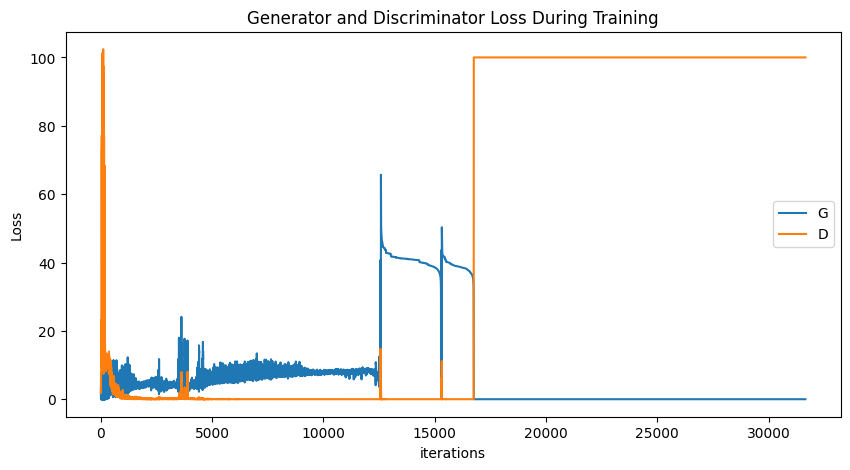

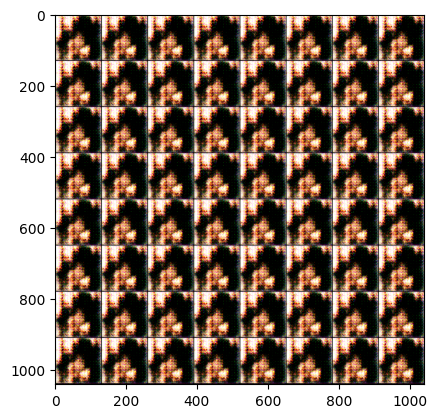

In [50]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

Данная модификация значительно дестабилизировала обучение и привела к расходимости

Эксперимент 4. Попробуем уменьшить количество сверток в дискриминаторе, заменив один из слоев на AvgPool2d. Меньшая по размеру модель должна быть менее подвержена переобучению.

In [8]:
# Имплементация дискриминатора

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.AvgPool2d(4, 2, 1),
            # state size. (ndf) x 64 x 64
            # nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(ndf * 2),
            # nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [52]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)

Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (3): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (1): ReLU()
        (2): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (3): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (4): ReLU()
        (5):

In [53]:
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

lr_g = 0.0001
lr_d = 0.00003

# Устанавливаем оптимизаторы для G и D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
# попробовать максимизацию лосс генератора

In [54]:
# Training Loop
run_dir = 'exp4'
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
writer = SummaryWriter(log_dir=f'./logs_dcgan/{run_dir}')

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            writer.add_scalar("iter/Loss_D", errD.item(), iters)
            writer.add_scalar("iter/Loss_G", errG.item(), iters)
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 1000 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            grid = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(grid)
            writer.add_image("gen_img_vis", grid, iters)


        iters += 1

writer.close()

Starting Training Loop...
[0/10][0/3166]	Loss_D: 2.1021	Loss_G: 3.1730	D(x): 0.6478	D(G(z)): 0.6435 / 0.0933
[0/10][50/3166]	Loss_D: 4.4365	Loss_G: 9.9334	D(x): 0.4927	D(G(z)): 0.6716 / 0.0001
[0/10][100/3166]	Loss_D: 1.9199	Loss_G: 6.8250	D(x): 0.7142	D(G(z)): 0.3364 / 0.0011
[0/10][150/3166]	Loss_D: 1.7176	Loss_G: 5.4806	D(x): 0.6108	D(G(z)): 0.3791 / 0.0042
[0/10][200/3166]	Loss_D: 0.5034	Loss_G: 4.7690	D(x): 0.8398	D(G(z)): 0.0815 / 0.0090
[0/10][250/3166]	Loss_D: 0.6369	Loss_G: 4.4552	D(x): 0.7830	D(G(z)): 0.1018 / 0.0117
[0/10][300/3166]	Loss_D: 0.9068	Loss_G: 7.5585	D(x): 0.7822	D(G(z)): 0.3035 / 0.0006
[0/10][350/3166]	Loss_D: 0.3644	Loss_G: 4.6150	D(x): 0.8701	D(G(z)): 0.1660 / 0.0100
[0/10][400/3166]	Loss_D: 0.2026	Loss_G: 4.6662	D(x): 0.9217	D(G(z)): 0.0910 / 0.0103
[0/10][450/3166]	Loss_D: 0.4138	Loss_G: 3.9057	D(x): 0.8759	D(G(z)): 0.0917 / 0.0271
[0/10][500/3166]	Loss_D: 0.9740	Loss_G: 4.1114	D(x): 0.8268	D(G(z)): 0.4401 / 0.0211
[0/10][550/3166]	Loss_D: 0.7094	Loss_G: 3.

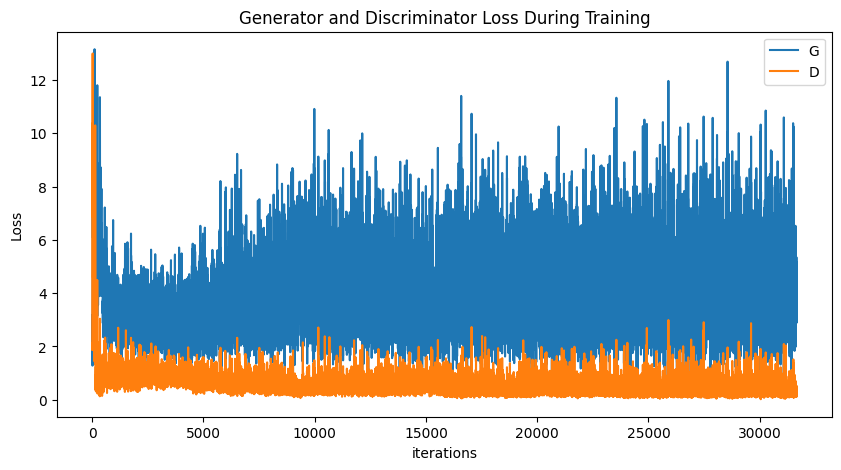

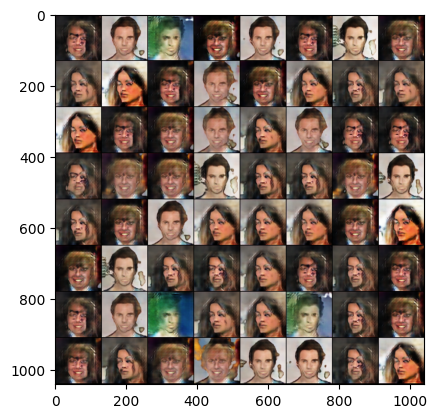

In [55]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

Применения данной модификации позволило улучшить сходимость, лосс дискриминатора перестал опускаться до околонулевых значений, и, судя по графикам, тренировка проходила намного стабильнее. Будем использовать данную модификацию и в дальнейших экспериментах.

Эксперимент 5. Попробуем модифицировать архитектуру генератора, добавив BatchNorm2d в блок CSPup

In [56]:
class CSPup(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super().__init__()
        self.kernel_size =kernel_size
        self.stride = stride
        self.padding = padding
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.split_channels = self.in_channels//2
        self.left = nn.Sequential(
            nn.ConvTranspose2d(self.split_channels, self.out_channels, self.kernel_size, self.stride, self.padding, bias=False)
        )
        self.right = nn.Sequential(
            nn.Conv2d(self.split_channels, self.out_channels , 1, 1, 0),
            nn.BatchNorm2d(self.out_channels),
            nn.ReLU(),
            nn.ConvTranspose2d(self.out_channels, self.out_channels , self.kernel_size, self.stride, self.padding, bias=False),
            nn.Conv2d(self.out_channels, self.out_channels , 1, 1, 0),
            nn.BatchNorm2d(self.out_channels),
            nn.ReLU(),
            nn.Conv2d(self.out_channels, self.out_channels, 1, 1, 0),
        )
    def forward(self, x):
        x1 = x[:, :self.split_channels, ...]
        x2 = x[:, self.split_channels:, ...]
        y = self.left(x1)+self.right(x2)
        return y


In [57]:
# Имплементация генератора
class Generator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # вход Z, идет в convolution
            CSPup(nz, ngf * 16, 4, 1, 0),
            # state size. (ngf*16) x 4 x 4
            CSPup(ngf * 16, ngf * 8, 4, 2, 1),
            # state size. (ngf*8) x 8 x 8
            CSPup(ngf * 8, ngf * 4, 4, 2, 1),
            # state size. (ngf*4) x 16 x 16
            CSPup(ngf * 4, ngf * 2, 4, 2, 1),
            # state size. (ngf*2) x 32 x 32
            CSPup(ngf * 2, ngf, 4, 2, 1),
            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 128 x 128
        )

    def forward(self, input):
        return self.main(input)

In [58]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

lr_g = 0.0001
lr_d = 0.00003

# Устанавливаем оптимизаторы для G и D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))


Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
        (3): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (4): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (5): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (6): ReLU()
        (7): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(512,

In [59]:
# Training Loop
run_dir = 'exp5'
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
writer = SummaryWriter(log_dir=f'./logs_dcgan/{run_dir}')

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            writer.add_scalar("iter/Loss_D", errD.item(), iters)
            writer.add_scalar("iter/Loss_G", errG.item(), iters)
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 1000 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            grid = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(grid)
            writer.add_image("gen_img_vis", grid, iters)


        iters += 1

writer.close()

Starting Training Loop...
[0/10][0/3166]	Loss_D: 2.2632	Loss_G: 3.0452	D(x): 0.2943	D(G(z)): 0.4180 / 0.0876
[0/10][50/3166]	Loss_D: 86.2441	Loss_G: 0.0003	D(x): 0.7052	D(G(z)): 1.0000 / 0.9997
[0/10][100/3166]	Loss_D: 5.5538	Loss_G: 9.4255	D(x): 0.3097	D(G(z)): 0.5722 / 0.0001
[0/10][150/3166]	Loss_D: 4.5113	Loss_G: 7.6683	D(x): 0.4777	D(G(z)): 0.9214 / 0.0006
[0/10][200/3166]	Loss_D: 4.7932	Loss_G: 5.5502	D(x): 0.4038	D(G(z)): 0.8892 / 0.0055
[0/10][250/3166]	Loss_D: 1.4447	Loss_G: 5.3372	D(x): 0.6471	D(G(z)): 0.4447 / 0.0050
[0/10][300/3166]	Loss_D: 1.4302	Loss_G: 5.0763	D(x): 0.6264	D(G(z)): 0.3815 / 0.0075
[0/10][350/3166]	Loss_D: 0.6485	Loss_G: 3.3675	D(x): 0.8816	D(G(z)): 0.3420 / 0.0565
[0/10][400/3166]	Loss_D: 1.7449	Loss_G: 1.4866	D(x): 0.5315	D(G(z)): 0.5314 / 0.2497
[0/10][450/3166]	Loss_D: 1.5278	Loss_G: 2.0929	D(x): 0.5354	D(G(z)): 0.4562 / 0.1259
[0/10][500/3166]	Loss_D: 1.8660	Loss_G: 1.6714	D(x): 0.4950	D(G(z)): 0.5327 / 0.1959
[0/10][550/3166]	Loss_D: 1.5947	Loss_G: 1

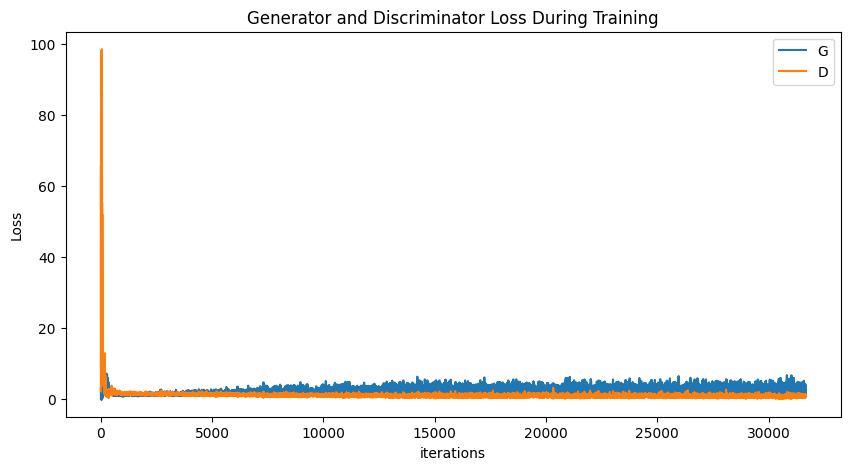

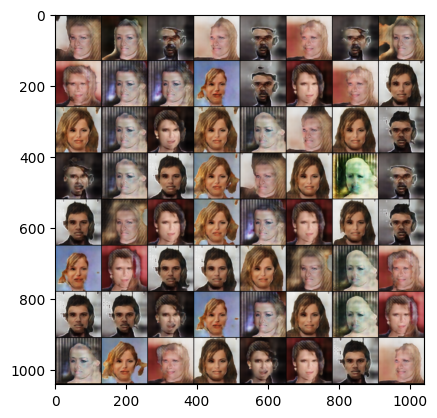

In [60]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

Эксперимент 6. Попробуем модифицировать архитектуру генератора, заменив функции активации в блоке CSPup на LeakyReLU

In [9]:
class CSPup(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        super().__init__()
        self.kernel_size =kernel_size
        self.stride = stride
        self.padding = padding
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.split_channels = self.in_channels//2
        self.left = nn.Sequential(
            nn.ConvTranspose2d(self.split_channels, self.out_channels, self.kernel_size, self.stride, self.padding, bias=False)
        )
        self.right = nn.Sequential(
            nn.Conv2d(self.split_channels, self.out_channels , 1, 1, 0),
            nn.BatchNorm2d(self.out_channels),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(self.out_channels, self.out_channels , self.kernel_size, self.stride, self.padding, bias=False),
            nn.Conv2d(self.out_channels, self.out_channels , 1, 1, 0),
            nn.BatchNorm2d(self.out_channels),
            nn.LeakyReLU(0.2),
            nn.Conv2d(self.out_channels, self.out_channels, 1, 1, 0),
        )
    def forward(self, x):
        x1 = x[:, :self.split_channels, ...]
        x2 = x[:, self.split_channels:, ...]
        y = self.left(x1)+self.right(x2)
        return y


In [10]:
# Имплементация генератора
class Generator(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # вход Z, идет в convolution
            CSPup(nz, ngf * 16, 4, 1, 0),
            # state size. (ngf*16) x 4 x 4
            CSPup(ngf * 16, ngf * 8, 4, 2, 1),
            # state size. (ngf*8) x 8 x 8
            CSPup(ngf * 8, ngf * 4, 4, 2, 1),
            # state size. (ngf*4) x 16 x 16
            CSPup(ngf * 4, ngf * 2, 4, 2, 1),
            # state size. (ngf*2) x 32 x 32
            CSPup(ngf * 2, ngf, 4, 2, 1),
            # state size. (ngf) x 64 x 64
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 128 x 128
        )

    def forward(self, input):
        return self.main(input)

In [63]:
# Инициализируем генератор
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Инициализируем веса
netG.apply(weights_init)

print(netG)

# инициализируем дискриминатор
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Инициализируем веса
netD.apply(weights_init)

print(netD)
# Инициализируем лосс
criterion = nn.BCELoss()

# Создаем батч с рандомным шумом для генерации
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

# Метки для реальных данных и фековых
real_label = 1.
fake_label = 0.

lr_g = 0.0001
lr_d = 0.0001

# Устанавливаем оптимизаторы для G и D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))


Generator(
  (main): Sequential(
    (0): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(50, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(50, 1024, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
        (3): ConvTranspose2d(1024, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (4): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
        (5): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (6): LeakyReLU(negative_slope=0.2)
        (7): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1))
      )
    )
    (1): CSPup(
      (left): Sequential(
        (0): ConvTranspose2d(512, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      )
      (right): Sequential(
        (0): Conv2d(512, 512, kernel_size=(1, 1)

In [64]:
# Training Loop
run_dir = 'exp6'
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
writer = SummaryWriter(log_dir=f'./logs_dcgan/{run_dir}')

print("Starting Training Loop...")
# Для каждой эпохи
for epoch in range(num_epochs):
    # Для каждого батча
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Учим дискриминатор: максимизируем log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Для батча
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Прямой прогон батча из реальных картинок D
        output = netD(real_cpu).view(-1)
        # Считаем лосс на всем батче реальных картинок
        errD_real = criterion(output, label)
        # Вычисляем градиенты для дискриминатора
        errD_real.backward()
        D_x = output.mean().item()

        ## Учим на полном фейковом батче
        # Генерируем бат латентных векторов
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Генерируем фековый батч с помощью G
        fake = netG(noise)
        label.fill_(fake_label)
        # Классифицируем фековый батч с помощью D
        output = netD(fake.detach()).view(-1)
        # Вычисляем лосс дискриминатора на фейковом батче
        errD_fake = criterion(output, label)
        # Вычисляем градиент для фейкового батча, он суммируется с предидущим
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Вычисляем ошибку на реальном и фековом батчах
        errD = errD_real + errD_fake
        # Обновляем веса D
        optimizerD.step()

        ############################
        # (2) Учим генератор: максимизируем log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # для генератора фейковые метки есть реальные (0 меняем на 1)
        # Так как мы обновили веса дискриминатора прогоним фековый батч через него еще  раз
        output = netD(fake).view(-1)
        # Вычислим лосс G основываясь на выходе D
        errG = criterion(output, label)
        # Вычислим градиент для G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Обновляем веса G
        optimizerG.step()

        # Выводим статистику обучения
        if i % 50 == 0:
            writer.add_scalar("iter/Loss_D", errD.item(), iters)
            writer.add_scalar("iter/Loss_G", errG.item(), iters)
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Сохраним лоссы
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Проверим какие картинки рисует генератор
        if (iters % 1000 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            grid = vutils.make_grid(fake, padding=2, normalize=True)
            img_list.append(grid)
            writer.add_image("gen_img_vis", grid, iters)


        iters += 1

writer.close()

Starting Training Loop...
[0/10][0/3166]	Loss_D: 2.0168	Loss_G: 9.9095	D(x): 0.4718	D(G(z)): 0.5539 / 0.0001
[0/10][50/3166]	Loss_D: 0.4150	Loss_G: 6.2324	D(x): 0.8548	D(G(z)): 0.0050 / 0.0047
[0/10][100/3166]	Loss_D: 3.2812	Loss_G: 23.1481	D(x): 0.8590	D(G(z)): 0.8699 / 0.0000
[0/10][150/3166]	Loss_D: 2.8532	Loss_G: 17.9160	D(x): 0.8378	D(G(z)): 0.8605 / 0.0001
[0/10][200/3166]	Loss_D: 1.9549	Loss_G: 6.1221	D(x): 0.5295	D(G(z)): 0.3441 / 0.0315
[0/10][250/3166]	Loss_D: 0.6522	Loss_G: 7.7117	D(x): 0.8476	D(G(z)): 0.2676 / 0.0024
[0/10][300/3166]	Loss_D: 0.4340	Loss_G: 6.3228	D(x): 0.9242	D(G(z)): 0.2113 / 0.0034
[0/10][350/3166]	Loss_D: 1.7576	Loss_G: 6.1168	D(x): 0.5675	D(G(z)): 0.3632 / 0.0062
[0/10][400/3166]	Loss_D: 1.0822	Loss_G: 6.2508	D(x): 0.8507	D(G(z)): 0.4559 / 0.0065
[0/10][450/3166]	Loss_D: 0.4911	Loss_G: 6.4822	D(x): 0.7556	D(G(z)): 0.0532 / 0.0168
[0/10][500/3166]	Loss_D: 0.7264	Loss_G: 5.4442	D(x): 0.7088	D(G(z)): 0.1320 / 0.0155
[0/10][550/3166]	Loss_D: 0.8158	Loss_G: 

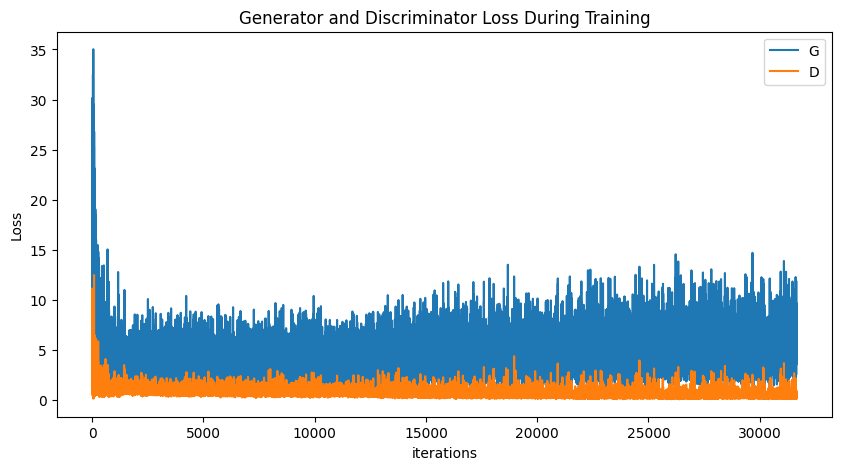

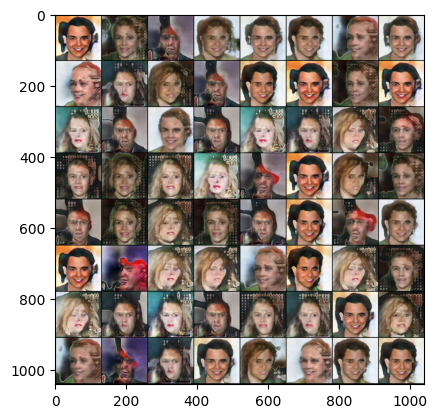

In [65]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
    grid_imgs = vutils.make_grid(fake, padding=2, normalize=True)
    plt.imshow(np.transpose(grid_imgs,(1,2,0)))

Применение BatchNorm и LeakyRELu в генераторе в целом ощутимо улучшило качество генерируемых картинок.